In [1]:
%load_ext autoreload
%autoreload 2

%cd ..

/home/rainorangelemon/Documents/Attend-and-Excite


/home/rainorangelemon/micromamba/envs/sam2/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import pandas as pd

def clean_object_name(object_name):
    if "a " in object_name:
        return object_name.split("a ")[1]
    else:
        return object_name

# do similar analysis for the other prompts: a frog and a mouse, a turtle with a bow
for prompt in ["a black car and a white clock", "a frog and a mouse", "a turtle with a bow"]:
    df = pd.read_csv(f"outputs/weak_lift/{prompt}.csv")
    if "with" in prompt:
        split_prompt = prompt.split("with")
    else:
        split_prompt = prompt.split("and")
    object_1 = split_prompt[0].strip()
    object_2 = split_prompt[1].strip()
    object_1 = clean_object_name(object_1)
    object_2 = clean_object_name(object_2)
    is_object_1 = (df["choice"] == f"{object_1} + {object_2}") | (df["choice"] == f"{object_1} + no {object_2}")
    is_object_2 = (df["choice"] == f"{object_1} + {object_2}") | (df["choice"] == f"no {object_1} + {object_2}")
    print(f"{object_1}:", is_object_1.mean(), f"{object_2}:", is_object_2.mean())

black car: 0.86 white clock: 0.62
frog: 1.0 mouse: 0.18
turtle: 1.0 bow: 0.33


In [6]:
# # check the pt file
# df = pd.read_csv("outputs/weak_lift/a black car and a white clock.csv")
# # get the image names
# image_names = df["image"].tolist()
# image_ids = [int(image_name.split("-")[-1].split(".")[0]) for image_name in image_names]
# # sort df using the image ids from 0 to 99, in increasing order
# df = df.sort_values(by="image", key=lambda x: [int(image_name.split("-")[-1].split(".")[0]) for image_name in x])
# # get the label for whether the object is white clock
# is_white_clock = (df["choice"] == "black car + white clock") | (df["choice"] == "no black car + white clock")

import torch
all_final_latents = torch.zeros(100, 4, 128, 128)
all_intermediate_latents = torch.zeros(100, 50, 4, 128, 128)
for i in range(10):
    lift_results = torch.load(f"outputs/3objects_lift/a lantern illuminating a path through misty woods/{i}_lift_results.pt", weights_only=True)
    all_final_latents[i] = lift_results["latents"]
    all_intermediate_latents[i] = torch.stack(lift_results["intermediate_latents"]).squeeze(1)[:, 0]

In [7]:
from diffusers import DiffusionPipeline
import torch
pipeline = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True)
pipeline.to("cuda")
pipeline.unet = torch.compile(pipeline.unet, mode="max-autotune", fullgraph=True)
# offload vae and text encoder
pipeline.vae.to("cpu");

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
from typing import List, Optional, Dict, Any, Union
from diffusers import StableDiffusionPipeline, StableDiffusionXLPipeline, DDPMScheduler
from lift_callback import LiftCallback
from tqdm import trange

@torch.inference_mode()
def calculate_score(latents,
                    callback: LiftCallback,
                    pipeline: Union[StableDiffusionPipeline, StableDiffusionXLPipeline],
                    prompts: List[str],
                    noise: Optional[torch.Tensor] = None,
                    timesteps: Optional[torch.Tensor] = None,
                    cross_attention_kwargs: Optional[Dict[str, Any]] = None,
):

    config = callback.config

    # Compile the unet, might take a while at the first run
    unet = pipeline.unet
    # unet = torch.compile(pipeline.unet, mode="max-autotune")

    device = latents.device
    # print whether the scheduler uses v-prediction or epsilon or others
    assert pipeline.scheduler.config.prediction_type == "epsilon", "Only epsilon prediction is supported for unet"
    scheduler = DDPMScheduler(beta_schedule="scaled_linear", beta_start=0.00085, beta_end=0.012)
    # set scheduler to training mode
    scheduler.set_timesteps(num_inference_steps=1000, device="cuda")

    # Get the UNet's dtype
    unet_dtype = pipeline.unet.dtype

    # Convert latents to UNet's dtype
    latents = latents.to(dtype=unet_dtype)

    n_prompts = len(prompts)
    # -> (n_trials,)
    B, *latent_shape = latents.shape
    if noise is None:
        noise = callback.get_noise(latent_shape).to(device, dtype=unet_dtype)
    else:
        noise = noise.to(device, dtype=unet_dtype)
    if timesteps is None:
        ts = callback.get_timesteps(scheduler).to(device)
    else:
        ts = timesteps.to(device)
    # -> (n_trials, *Latent_shape)
    num_latent_dims = len(latents.shape) - 1

    score_results = torch.zeros((B, n_prompts, len(ts), *latent_shape), dtype=unet_dtype)

    image_idxs = torch.arange(B, device=device)[:, None, None].expand(-1, n_prompts, len(ts)).flatten().to(device)
    algebra_idxs = torch.arange(n_prompts, device=device)[None, :, None].expand(B, -1, len(ts)).flatten().to(device)
    trial_idxs = torch.arange(len(ts), device=device)[None, None, :].expand(B, n_prompts, -1).flatten().to(device)

    idx = 0
    for _ in trange(len(trial_idxs) // config.batch_size + int(len(trial_idxs) % config.batch_size != 0), leave=False):
        current_latents = latents[image_idxs[idx:idx + config.batch_size]]
        current_prompts = [prompts[idx] for idx in algebra_idxs[idx:idx + config.batch_size]]
        current_noise = noise[trial_idxs[idx:idx + config.batch_size]]
        current_ts = ts[trial_idxs[idx:idx + config.batch_size]]

        noisy_latents = scheduler.add_noise(current_latents, current_noise, current_ts)

        # Double the batch size to add unconditional prediction
        latent_model_input = noisy_latents
        t = current_ts

        # Encode input prompt
        if isinstance(pipeline, StableDiffusionPipeline):
            prompt_embeds, _ = pipeline.encode_prompt(
                current_prompts,
                device=device,
                num_images_per_prompt=1,
                do_classifier_free_guidance=False,
            )
            current_prompt_embeds = prompt_embeds
            # predict the noise residual
            noise_pred = unet(
                latent_model_input,
                t,
                encoder_hidden_states=current_prompt_embeds,
                cross_attention_kwargs=cross_attention_kwargs,
                return_dict=False,
            )[0]

        elif isinstance(pipeline, StableDiffusionXLPipeline):
            # Encode input prompt
            (prompt_embeds, _, pooled_prompt_embeds, _) = pipeline.encode_prompt(
                current_prompts,
                device=device,
                num_images_per_prompt=1,
                do_classifier_free_guidance=False,
            )

            # Get timestep conditioning
            timestep_cond = None
            if pipeline.unet.config.time_cond_proj_dim is not None:
                guidance_scale_tensor = torch.tensor(pipeline.guidance_scale - 1).repeat(len(current_ts))
                timestep_cond = pipeline.get_guidance_scale_embedding(
                    guidance_scale_tensor,
                    embedding_dim=pipeline.unet.config.time_cond_proj_dim
                ).to(device=device, dtype=latent_model_input.dtype)

            # Get added time IDs conditioning
            add_text_embeds = pooled_prompt_embeds
            text_encoder_projection_dim = (
                pipeline.text_encoder_2.config.projection_dim
                if pipeline.text_encoder_2 is not None
                else int(pooled_prompt_embeds.shape[-1])
            )
            add_time_ids = pipeline._get_add_time_ids(
                original_size=(1024, 1024),
                crops_coords_top_left=(0, 0),
                target_size=(1024, 1024),
                dtype=prompt_embeds.dtype,
                text_encoder_projection_dim=text_encoder_projection_dim
            ).to(device)
            add_time_ids = add_time_ids.to(device).repeat(len(current_ts), 1)

            added_cond_kwargs = {"text_embeds": add_text_embeds, "time_ids": add_time_ids}

            latent_model_input = scheduler.scale_model_input(latent_model_input, t)

            # predict the noise residual
            noise_pred = unet(
                latent_model_input,
                t,
                encoder_hidden_states=prompt_embeds,
                timestep_cond=timestep_cond,
                cross_attention_kwargs=cross_attention_kwargs,
                added_cond_kwargs=added_cond_kwargs,
                return_dict=False,
            )[0]

        noise_pred_text = noise_pred
        # -> (batch_size,)
        score_results[image_idxs[idx:idx + config.batch_size],
                            algebra_idxs[idx:idx + config.batch_size],
                            trial_idxs[idx:idx + config.batch_size]] = noise_pred_text.cpu()

        idx += len(current_ts)
    return score_results

In [9]:
ddpm_scheduler = DDPMScheduler(beta_schedule="scaled_linear", beta_start=0.00085, beta_end=0.012)

pipeline.scheduler.set_timesteps(num_inference_steps=50, device="cuda")
sqrt_alpha_prod = ddpm_scheduler.alphas_cumprod ** 0.5
sqrt_one_minus_alpha_prod = (1 - ddpm_scheduler.alphas_cumprod) ** 0.5
prev_t = pipeline.scheduler.timesteps[1:]
x0 = all_intermediate_latents[:, -1]
scaled_x0 = torch.einsum("t, b c h w -> b t c h w", sqrt_alpha_prod[prev_t.cpu().long()], x0)

pipeline.scheduler.set_timesteps(timesteps=prev_t.long().cpu(), num_inference_steps=None)
sigma = pipeline.scheduler.sigmas.to(prev_t.device)[:-1]
intended_noise = (all_intermediate_latents[:, :-1] - x0[:, None]) / sigma[:, None, None, None].to(all_intermediate_latents.device)

In [10]:
scaled_intermediate_latents = all_intermediate_latents[:, :-1] / ((sigma**2 + 1) ** 0.5)[:, None, None, None].to(all_intermediate_latents.device)
(ddpm_scheduler.add_noise(x0, intended_noise[:, 1], prev_t[1].long()) - scaled_intermediate_latents[:, 1]).abs().max()

tensor(5.9605e-08)

In [12]:
from lift_callback import LiftCallback
from config import LiftConfig
from tqdm import tqdm
config = LiftConfig(prompt="a turtle and a ball in a box", subtract_unconditional=False,
                    batch_size=8,
                    same_noise=False,
)
callback = LiftCallback(config)

score_composed_all = []
score_turtle_all = []
score_ball_all = []
score_box_all = []
score_uncond_all = []
latest_latents = all_final_latents.to("cuda:0")
for img_idx in tqdm(range(10)):
    score_results = calculate_score(latest_latents[[img_idx]],
                                    callback,
                                    pipeline,
                                    prompts=["a lantern illuminating a path through misty woods", "a lantern", "a path", "woods", ""],
                                    # noise=intended_noise[img_idx],
                                    # timesteps=prev_t.long(),
                                    )
    score_composed_all.append(score_results[:, 0])
    score_turtle_all.append(score_results[:, 1])
    score_ball_all.append(score_results[:, 2])
    score_box_all.append(score_results[:, 3])
    score_uncond_all.append(score_results[:, -1])

score_composed_all = torch.cat(score_composed_all, dim=0)
score_turtle_all = torch.cat(score_turtle_all, dim=0)
score_ball_all = torch.cat(score_ball_all, dim=0)
score_box_all = torch.cat(score_box_all, dim=0)
score_uncond_all = torch.cat(score_uncond_all, dim=0)

  0%|          | 0/125 [00:00<?, ?it/s]E0122 09:49:38.002000 2456338 site-packages/torch/_inductor/select_algorithm.py:1300] [0/1] Exception out of resource: shared memory, Required: 131072, Hardware limit: 101376. Reducing block sizes or `num_stages` may help. for benchmark choice TritonTemplateCaller(/tmp/torchinductor_rainorangelemon/x7/cx7dwfgsmygrfv6x6mpqqbw2mldkmzp6x54u3yvofwwkeahihwke.py, ACC_TYPE='tl.float32', ALLOW_TF32=False, BLOCK_K=64, BLOCK_M=128, BLOCK_N=128, B_PROLOGUE_CAST_TYPE=None, EVEN_K=True, GROUP_M=8, num_stages=5, num_warps=8)
E0122 09:49:38.003000 2456338 site-packages/torch/_inductor/select_algorithm.py:1300] [0/1] Exception out of resource: shared memory, Required: 147456, Hardware limit: 101376. Reducing block sizes or `num_stages` may help. for benchmark choice TritonTemplateCaller(/tmp/torchinductor_rainorangelemon/dt/cdtth3byby3f6frkbkslt466pvayjarrmwn4fu3wnnrj54ffqz7y.py, ACC_TYPE='tl.float32', ALLOW_TF32=False, BLOCK_K=128, BLOCK_M=64, BLOCK_N=128, B_PRO

100%|██████████| 10/10 [00:47<00:00,  4.72s/it]


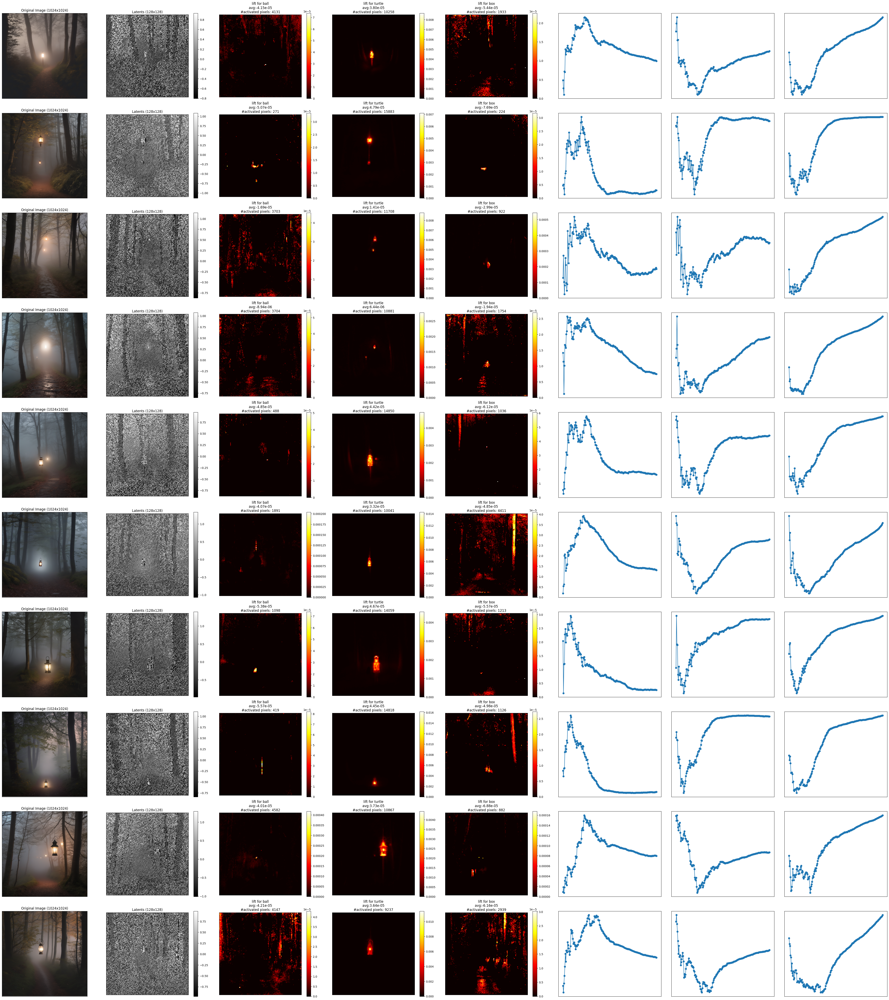

In [14]:
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms import GaussianBlur
import torch
from typing import Tuple, Optional
from dataclasses import dataclass
import numpy as np
from tqdm import tqdm
plt.rcParams['xtick.bottom'] = False
plt.rcParams['xtick.labelbottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.labelleft'] = False


@dataclass
class VisualizationConfig:
    use_gaussian_smoothing: bool = False
    draw_pure_lift: bool = False
    base_type: str = "composed"  # Options: "composed", "noise", "uncond"
    threshold: float = 0
    n_samples: int = 10
    fig_size: Tuple[int, int] = (45, 50)
    output_path: str = "outputs/3objects_lift/a lantern illuminating a path through misty woods"

class HeatmapGenerator:
    def __init__(self, config: VisualizationConfig):
        self.config = config

    def apply_gaussian_smoothing(self, heatmap: torch.Tensor) -> torch.Tensor:
        if self.config.use_gaussian_smoothing:
            return GaussianBlur(kernel_size=3)(heatmap[None].float())[0]
        return heatmap

    def calculate_pure_lift(self, score_target: torch.Tensor, base: torch.Tensor, noise: Optional[torch.Tensor] = None) -> torch.Tensor:
        if self.config.base_type in ["composed", "uncond"]:
            return (score_target - base).pow(2).mean(dim=(1, 2))
        elif self.config.base_type == "noise":
            return ((base - noise).pow(2) - (score_target - noise).pow(2)).mean(dim=(1, 2))

    def calculate_relative_lift(self, base: torch.Tensor, current_score: torch.Tensor, other_scores: list[torch.Tensor]) -> torch.Tensor:
        """
        Calculate relative lift by comparing current score's MSE against minimum MSE from other scores.

        Args:
            base: Base tensor to calculate MSE against
            current_score: Score tensor for current object
            other_scores: List of score tensors for other objects

        Returns:
            Relative lift tensor
        """
        if torch.allclose(base, data["score_composed_all"]):
            current_mse = (base - current_score).pow(2).mean(dim=(1, 2))

            # Stack all other scores' MSEs and get minimum
            other_mses = torch.stack([
                (base - other_score).pow(2).mean(dim=(1, 2))
                for other_score in other_scores
            ])
            min_other_mse = other_mses.min(dim=0)[0]

            return (min_other_mse - current_mse)

        else:
            current_mse = (base - current_score).pow(2).mean(dim=(1, 2))

            # Stack all other scores' MSEs and get maximum
            other_mses = torch.stack([
                (base - other_score).pow(2).mean(dim=(1, 2))
                for other_score in other_scores
            ])
            max_other_mse = other_mses.max(dim=0)[0]

            return (current_mse - max_other_mse)


    def generate_heatmap(self, data, score_target: torch.Tensor, base: torch.Tensor,
                        noise: Optional[torch.Tensor] = None, idx: int = 0) -> torch.Tensor:
        if self.config.draw_pure_lift:
            heatmap = self.calculate_pure_lift(score_target, base, noise)[idx]
        else:
                # Get all score tensors except the target one
                other_scores = [
                    data[f'score_{name}_all']
                    for name in ['ball', 'turtle', 'box']
                    if not torch.allclose(data[f'score_{name}_all'], score_target)
                ]
                heatmap = self.calculate_relative_lift(base, score_target, other_scores)[idx]

        heatmap = self.apply_gaussian_smoothing(heatmap)
        return (heatmap - self.config.threshold)

class TrajectoryPlotter:
    def __init__(self, config: VisualizationConfig):
        self.config = config

    def calculate_trajectory(self, base: torch.Tensor, score1: torch.Tensor,
                           score2: torch.Tensor, idx: int) -> torch.Tensor:
        diff_along_trajectory = ((base - score1).pow(2) - (base - score2).pow(2))[idx]

        if self.config.use_gaussian_smoothing:
            diff_along_trajectory = GaussianBlur(kernel_size=3)(diff_along_trajectory.float())

        trajectory_range = torch.arange(1, diff_along_trajectory.shape[0] + 1)
        cumsum = diff_along_trajectory.cumsum(dim=0)
        normalized = cumsum / trajectory_range[:, None, None, None].to(diff_along_trajectory.device)
        mean_diff = normalized.mean(dim=1).flatten(1, 2)

        return (mean_diff > self.config.threshold).sum(dim=-1)

class VisualizationPlotter:
    def __init__(self, config: VisualizationConfig):
        self.config = config
        self.heatmap_gen = HeatmapGenerator(config)
        self.trajectory_plotter = TrajectoryPlotter(config)

    def setup_plot(self) -> Tuple[plt.Figure, np.ndarray]:
        plt.clf()
        plt.close("all")
        fig, ax = plt.subplots(self.config.n_samples, 8, figsize=self.config.fig_size)
        return fig, ax

    def plot_original_image(self, ax, idx: int):
        image = Image.open(f"{self.config.output_path}/{idx}.png")
        ax[0].imshow(image)
        ax[0].set_title("Original Image (1024x1024)")

    def plot_latents(self, ax, latents: torch.Tensor):
        im = ax[1].imshow(latents.cpu().numpy(), cmap="gray")
        plt.colorbar(im, ax=ax[1])
        ax[1].set_title("Latents (128x128)")

    def plot_heatmap(self, ax, heatmap: torch.Tensor, title: str):
        im = ax.imshow(heatmap.relu().cpu().numpy(), cmap="hot")
        plt.colorbar(im, ax=ax)
        ax.set_title(f"{title}\navg:{heatmap.mean().item():.2e}\n#activated pixels: {(heatmap > self.config.threshold).sum().item()}")

    def plot_trajectory(self, ax, trajectory: torch.Tensor):
        ax.plot(trajectory.cpu().numpy(), marker='o')

    def create_visualization(self, data: dict):
        fig, ax = self.setup_plot()

        for idx in tqdm(range(self.config.n_samples)):
            # Plot original image and latents
            self.plot_original_image(ax[idx], idx)
            self.plot_latents(ax[idx], data['latest_latents'][idx].mean(dim=0))

            # Generate and plot heatmaps
            for obj_idx, obj_name in enumerate(['ball', 'turtle', 'box']):
                heatmap = self.heatmap_gen.generate_heatmap(
                    data,
                    data[f'score_{obj_name}_all'],
                    data['base_to_test'],
                    data.get('noise'),
                    idx
                )
                self.plot_heatmap(ax[idx][obj_idx + 2], heatmap, f"lift for {obj_name}")

            # Plot trajectories
            for traj_idx, (obj1, obj2) in enumerate([('turtle', 'ball'), ('ball', 'turtle'), ('box', 'turtle')]):
                trajectory = self.trajectory_plotter.calculate_trajectory(
                    data['base_to_test'],
                    data[f'score_{obj1}_all'],
                    data[f'score_{obj2}_all'],
                    idx
                )
                self.plot_trajectory(ax[idx][traj_idx + 5], trajectory)

        plt.tight_layout()
        plt.savefig("a turtle and a ball in a box.png")

# Configuration
config = VisualizationConfig()

noise = None
base = config.base_type
# Determine base tensor to test
if base == "composed":
    base_to_test = score_composed_all
elif base == "noise":
    base_to_test = noise
elif base == "uncond":
    base_to_test = score_uncond_all

# Prepare data dictionary
data = {
    'latest_latents': latest_latents,
    'score_composed_all': score_composed_all,
    'score_ball_all': score_ball_all,
    'score_turtle_all': score_turtle_all,
    'score_box_all': score_box_all,
    'score_uncond_all': score_uncond_all,
    'base_to_test': base_to_test,
    'noise': noise,  # if base == "noise" else None,
}

# Create and run visualization
visualizer = VisualizationPlotter(config)
visualizer.create_visualization(data)

100%|██████████| 10/10 [00:02<00:00,  3.79it/s]


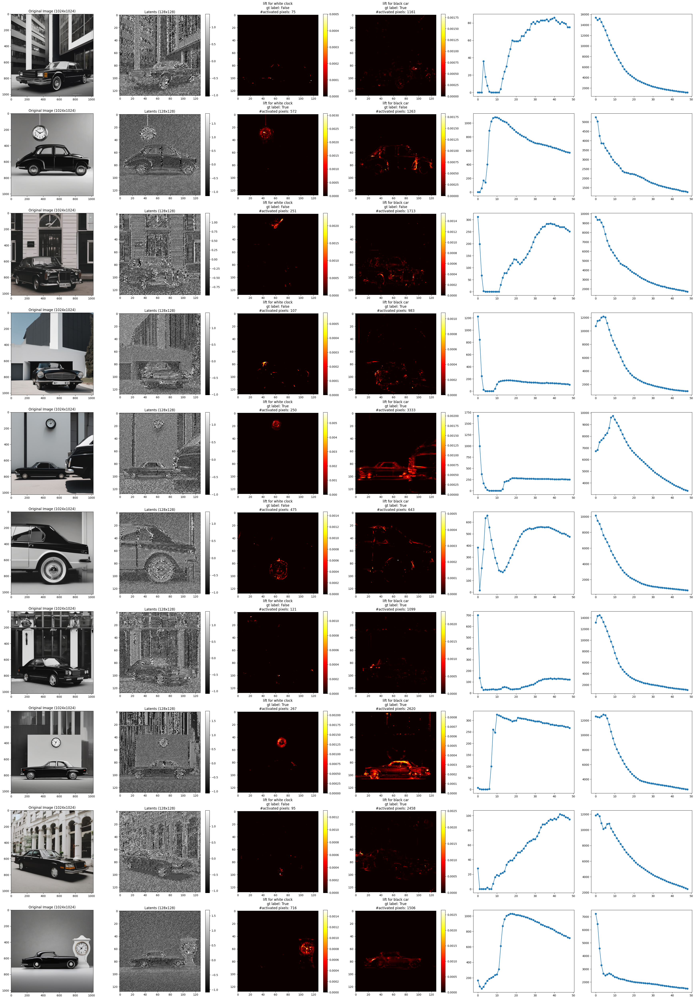

In [21]:
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms import GaussianBlur

# noise = intended_noise[:10]
noise = callback.get_noise([4, 128, 128])[:config.n_samples]
use_gaussian_smoothing = False
draw_pure_lift = False
base = "composed"
# logp_uncond_all = (score_uncond_all - noise).pow(2)
# logp_black_car_and_white_clock_all = (score_black_car_and_white_clock_all - noise).pow(2)
# logp_white_clock_all = (score_white_clock_all - noise).pow(2)
# logp_black_car_all = (score_black_car_all - noise).pow(2)

threshold = 1e-4

if base == "composed":
    base_to_test = score_black_car_and_white_clock_all
elif base == "noise":
    base_to_test = noise
elif base == "uncond":
    base_to_test = score_uncond_all

plt.clf()
plt.close("all")
_, ax = plt.subplots(10, 6, figsize=(35, 50))
for idx in tqdm(range(10)):
    # read the image
    image = Image.open(f"outputs/weak_lift/a turtle and a ball in a box/{idx}.png")
    ax[idx][0].imshow(image)
    ax[idx][0].set_title("Original Image (1024x1024)")

    latents = latest_latents[idx].mean(dim=0)
    # plot the heatmap
    im2 = ax[idx][1].imshow(latents.cpu().numpy(), cmap="gray")
    plt.colorbar(im2, ax=ax[idx][1])
    ax[idx][1].set_title("Latents (128x128)")

    # heatmap = (score_black_car_and_white_clock_all - score_black_car_all).pow(2).mean(dim=1)[idx][-1]
    # heatmap_rectified = heatmap.clone()
    # heatmap_rectified[heatmap_rectified < 0] = 0
    # # plot the heatmap
    # im3 = ax[2].imshow(heatmap_rectified.cpu().numpy(), cmap="hot")
    # plt.colorbar(im3, ax=ax[2])
    # ax[2].set_title(f"white clock: {is_white_clock.values[idx]}, heatmap mean: {heatmap.mean().item():.2e}")

    if draw_pure_lift:
        if base == "composed":
            heatmap = (score_black_car_all - base_to_test).pow(2).mean(dim=(1, 2))[idx]
        elif base == "noise":
            heatmap = ((score_uncond_all - noise).pow(2) - (score_black_car_all - noise).pow(2)).mean(dim=(1, 2))[idx]
        else:
            heatmap = (score_white_clock_all - base_to_test).pow(2).mean(dim=(1, 2))[idx]
    else:
        heatmap = ((base_to_test - score_black_car_all).pow(2) - (base_to_test - score_white_clock_all).pow(2)).mean(dim=(1, 2))[idx]
    if use_gaussian_smoothing:
        heatmap = GaussianBlur(kernel_size=3)(heatmap[None].float())[0]
    # plot the heatmap
    im4 = ax[idx][2].imshow(((heatmap - threshold).relu()).cpu().numpy(), cmap="hot")
    plt.colorbar(im4, ax=ax[idx][2])
    ax[idx][2].set_title(f"lift for white clock\ngt label: {is_white_clock.values[idx]}\n#activated pixels: {(heatmap > threshold).sum().item()}")

    if draw_pure_lift:
        if base == "composed":
            heatmap = (score_white_clock_all - base_to_test).pow(2).mean(dim=(1, 2))[idx]
        elif base == "noise":
            heatmap = ((score_uncond_all - noise).pow(2) - (score_white_clock_all - noise).pow(2)).mean(dim=(1, 2))[idx]
        else:
            heatmap = (score_black_car_all - base_to_test).pow(2).mean(dim=(1, 2))[idx]
    else:
        heatmap = ((base_to_test - score_white_clock_all).pow(2) - (base_to_test - score_black_car_all).pow(2)).mean(dim=(1, 2))[idx]
    if use_gaussian_smoothing:
        heatmap = GaussianBlur(kernel_size=3)(heatmap[None].float())[0]
    # plot the heatmap
    im5 = ax[idx][3].imshow(((heatmap - threshold).relu()).cpu().numpy(), cmap="hot")
    plt.colorbar(im5, ax=ax[idx][3])
    ax[idx][3].set_title(f"lift for black car\ngt label: {is_black_car.values[idx]}\n#activated pixels: {(heatmap > threshold).sum().item()}")

    # lift_o_black_car_and_white_clock = (score_black_car_and_white_clock_all - score_white_clock_all).pow(2).mean(dim=(1, 2))
    # lift_o_black_car = (score_black_car_and_white_clock_all - score_black_car_all).pow(2).mean(dim=(1, 2))
    # lift_o_white_clock = (score_black_car_and_white_clock_all - score_white_clock_all).pow(2).mean(dim=(1, 2))
    # lift_o_uncond = (score_black_car_and_white_clock_all - score_uncond_all).pow(2).mean(dim=(1, 2))
    # heatmap = ((lift_o_uncond < lift_o_black_car) & (lift_o_uncond < lift_o_white_clock))[idx]
    # diff_over_time = ((base_to_test - score_black_car_all).pow(2) - (base_to_test - score_white_clock_all).pow(2)).mean(dim=2).flatten(2, 3).max(dim=-1).values[idx]
    diff_along_trajectory = ((base_to_test - score_black_car_all).pow(2) - (base_to_test - score_white_clock_all).pow(2))[idx]
    if use_gaussian_smoothing:
        diff_along_trajectory = GaussianBlur(kernel_size=3)(diff_along_trajectory.float())
    diff_over_time = ((diff_along_trajectory.cumsum(dim=0) / torch.arange(1, diff_along_trajectory.shape[0] + 1)[:, None, None, None].to(diff_along_trajectory.device)).mean(dim=1).flatten(1, 2) > threshold).sum(dim=-1)
    ax[idx][4].plot(diff_over_time.cpu().numpy(), marker='o')
    # ax[idx][4].set_title(f"lift for black car\ngt label: {is_black_car.values[idx]}\n#activated pixels: {(heatmap > 0).sum().item()}")

    # diff_over_time = -((base_to_test - score_black_car_all).pow(2) - (base_to_test - score_white_clock_all).pow(2)).mean(dim=2).flatten(2, 3).min(dim=-1).values[idx]
    diff_over_time = ((diff_along_trajectory.cumsum(dim=0) / torch.arange(1, diff_along_trajectory.shape[0] + 1)[:, None, None, None].to(diff_along_trajectory.device)).mean(dim=1).flatten(1, 2) < -threshold).sum(dim=-1)
    ax[idx][5].plot(diff_over_time.cpu().numpy(), marker='o')

plt.tight_layout()
plt.savefig("a black car and a white clock.png")

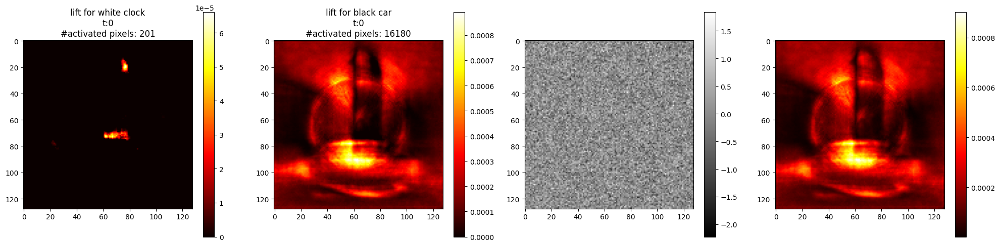

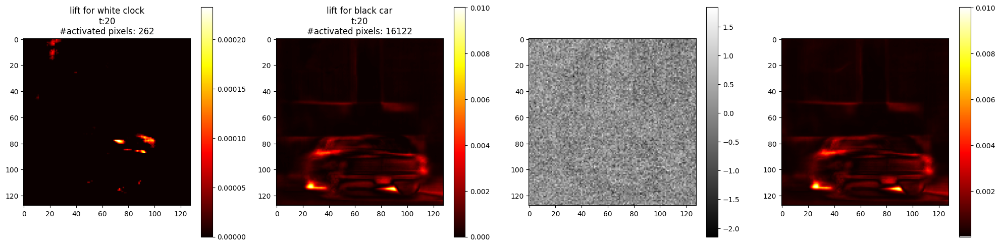

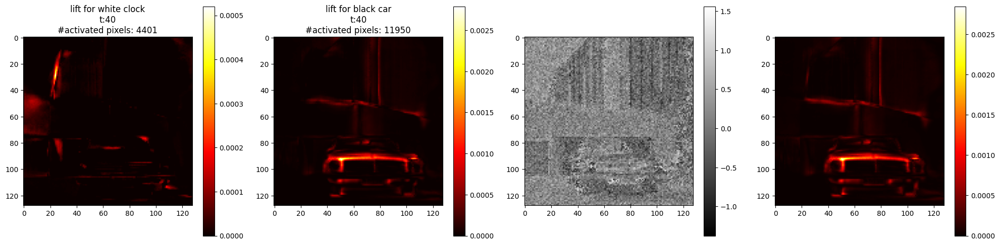

IndexError: index 60 is out of bounds for dimension 0 with size 49

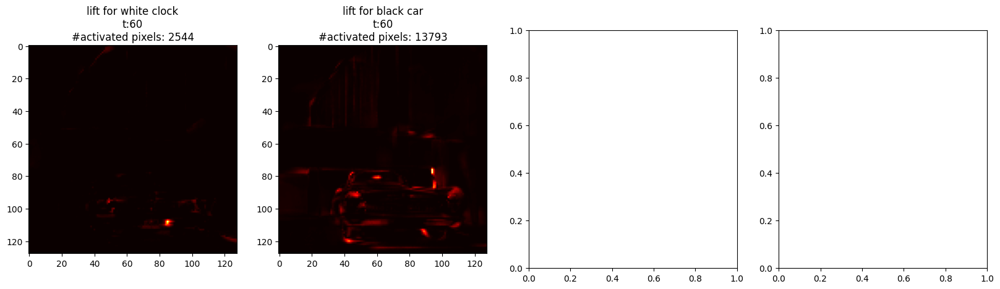

In [91]:
for t in range(score_black_car_and_white_clock_all.shape[1]):
    plt.clf()
    plt.close("all")
    _, ax = plt.subplots(1, 4, figsize=(20, 5))
    img_idx = 3
    score_black_car_and_white_clock_at_t = score_black_car_and_white_clock_all[img_idx, t]
    score_black_car_at_t = score_black_car_all[img_idx, t]
    score_white_clock_at_t = score_white_clock_all[img_idx, t]

    lift_for_white_clock = (score_black_car_and_white_clock_at_t - score_black_car_at_t).pow(2) - (score_black_car_and_white_clock_at_t - score_white_clock_at_t).pow(2)
    lift_for_black_car = (score_black_car_and_white_clock_at_t - score_white_clock_at_t).pow(2) - (score_black_car_and_white_clock_at_t - score_black_car_at_t).pow(2)

    heatmap_for_white_clock = lift_for_white_clock.mean(dim=0).relu().cpu().numpy()
    heatmap_for_black_car = lift_for_black_car.mean(dim=0).relu().cpu().numpy()
    im0 = ax[0].imshow(heatmap_for_white_clock, cmap="hot")
    ax[0].set_title(f"lift for white clock\nt:{t}\n#activated pixels: {(heatmap_for_white_clock > 0).sum().item()}")
    im1 = ax[1].imshow(heatmap_for_black_car, cmap="hot")
    ax[1].set_title(f"lift for black car\nt:{t}\n#activated pixels: {(heatmap_for_black_car > 0).sum().item()}")
    latent = scaled_intermediate_latents[img_idx][t].mean(dim=0)
    im2 = ax[2].imshow(latent.cpu().numpy(), cmap="gray")
    scale_for_black_car = (score_black_car_and_white_clock_at_t - score_white_clock_at_t).pow(2).mean(dim=0).cpu().numpy()
    im3 = ax[3].imshow(scale_for_black_car, cmap="hot")
    plt.colorbar(im0, ax=ax[0])
    plt.colorbar(im1, ax=ax[1])
    plt.colorbar(im2, ax=ax[2])
    plt.colorbar(im3, ax=ax[3])
    plt.tight_layout()
    plt.show()

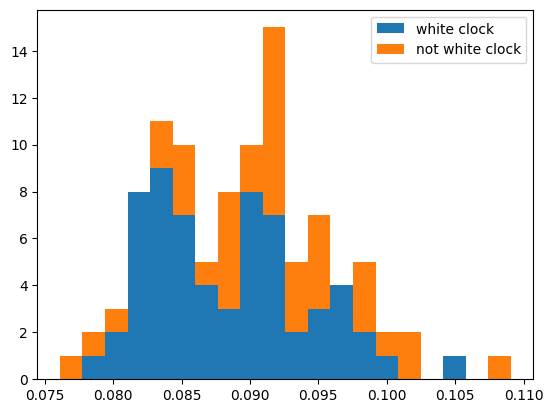

In [25]:
# print the histogram of the logp_white_clock_all
import matplotlib.pyplot as plt
logp_white_clock = logp_white_clock_all.mean(dim=-1).cpu().numpy()
logp_no_white_clock = logp_no_white_clock_all.mean(dim=-1).cpu().numpy()
logp_white_clock_is_white_clock = logp_white_clock[is_white_clock]
logp_white_clock_is_not_white_clock = logp_white_clock[~is_white_clock]
plt.hist([logp_white_clock_is_white_clock, logp_white_clock_is_not_white_clock], stacked=True, label=["white clock", "not white clock"], bins=20)
plt.legend()
plt.show()